In [1]:
import re
import pandas as pd
import numpy as np
from starfit import Single, Multi
from pathlib import Path
import socket
import matplotlib.pyplot as plt
from starfit.utils import find_data
from starfit.autils.stardb import StarDB
from starfit.autils.abusets import SolAbu

import warnings
warnings.filterwarnings('ignore', category=RuntimeWarning)

In [2]:
hostname = socket.gethostname()
if hostname == 'jerome-linux':
    datadir = Path('/home/jerome/Documents/GitHub')
elif hostname == 'sage2020':
    datadir = Path('/home/jiangrz/hdd23')
stardir = datadir/Path('Data/rproc/star')
database = [
    'rproc.wu.star.el.y.stardb.xz', 
    'rproc.just15.star.el.y.stardb.xz', 
    'znuc2012.S4.star.el.y.stardb.gz', 
]

element_list = [
    'h', 'he', 'li', 'be', 'b', 'c', 'n', 'o', 'file', 'ne', 
    'na', 'mg', 'al', 'si', 'p', 's', 'cl', 'ar', 'k', 'ca',
    'sc', 'ti', 'v', 'cr', 'mn', 'fe', 'co', 'ni', 'cu', 'zn',
    'ga', 'ge', 'as', 'se', 'br', 'kr', 'rb', 'sr', 'y', 'zr',
    'nb', 'mo', 'ru', 'rh', 'pd', 'ag', 'cd', 'in', 'sn', 'sb',
    'te', 'i', 'xe', 'cs', 'ba', 'la', 'ce', 'pr', 'nd', 'sm',
    'eu', 'gd', 'tb', 'dy', 'ho', 'er', 'tm', 'yb', 'lu', 'hf',
    'ta', 'w', 're', 'os', 'ir', 'pt', 'au', 'hg', 'tl', 'pb',
    'bi'
]
element_list = [_.capitalize() for _ in element_list]

In [3]:
df = pd.read_csv('solresult.csv', header=[0, 1])
redchisqr = df.loc[:, ('property', 'fitness')].values
name_nsm = df.loc[redchisqr < 5, ('property', 'name')].values
df_wu = pd.read_csv('solresult_wu.csv', header=[0, 1])
redchisqr_wu = df_wu.loc[:, ('property', 'fitness')].values
name_nsm_wu = df_wu.loc[redchisqr_wu < 5, ('property', 'name')].values
name_inter = np.intersect1d(name_nsm, name_nsm_wu)
name_inter = np.delete(name_inter, np.argwhere(name_inter=='J0949+2707'))
flag = np.in1d(df.loc[:, ('property', 'name')].values, name_inter)

In [4]:
# columns = []
# properties = ['name', 'FeH', 'N', 'fitness']
# freeparams_num = 0
# columns.extend([('property', prop) for prop in properties])
# for _didx, _dname in enumerate(database[::2]):
#     dbpath = find_data('db', _dname)
#     _db = StarDB(dbpath, silent=True)
#     freeparams_num += np.sum(1-_db.fieldflags)
#     fieldnames = _db.fieldnames
#     columns.extend([('%d'%_didx, _) for _ in np.append(fieldnames, 'offset')])
#     df_result = pd.DataFrame(columns=columns)
#     df_result.columns = pd.MultiIndex.from_tuples(df_result.columns, names=['db_index','fieldname'])

# for objname in name_inter:
#     starname = objname
#     flag = df.loc[:, ('property', 'name')].values == starname
#     starFeH = df.loc[flag, ('property', 'FeH')].values[0]
#     starpath = stardir/('%s.dat'%(objname))
#     comb = Multi(
#         starpath, db=database[::2], 
#         z_min=1, z_max=100, z_exclude=[1, 2, 3, 6, 19, 21, 24, 30], 
#         silent=True, sol_size=2, group=[1, 1]
#     )
#     comb.plot(xlim=(0, 84), ylim=(-5, 2))
    
#     starN = comb.star.element_abundances[~comb.exclude_index].shape[0]
#     dof = starN - freeparams_num - 2

#     starfitn = comb.sorted_fitness[0] / dof
#     starindices = comb.sorted_stars[0]['index']
#     staroffsets = comb.sorted_stars[0]['offset']
#     db_idx = comb.db_idx[starindices]
#     db_off = comb.db_off
#     starindices -= db_off
#     starprop = [starname, starFeH, starN, starfitn]
#     columndata = starprop
#     for _db_idx, _staridx, _staroffset in zip(db_idx, starindices, staroffsets):
#         starfield = list(comb.db[_db_idx].fielddata[_staridx])
#         stardata = starfield + [_staroffset]
#         columndata += stardata
#     df_result.loc[len(df_result)] = columndata
# df_result.to_csv('goodfit_result.csv', index=False)


In [5]:
names = [
    'Vel', '[Fe/H]', 'Isotope', 
    '13', '15', '20', '25', '30', '40', '60', '80', '120'
]
columns = [
    'Vel', '[Fe/H]', 'Element', 
    '13', '15', '20', '25', '30', '40', '60', '80', '120'
]
yield_isotope = pd.read_table(
    'apj27313/apjsaacb24t8_mrt.txt', 
    skiprows=np.arange(22), 
    sep=r'\s+', 
    names=names
)

In [6]:
Vels = [0, 150, 300]
Vel = 0
FeH = -3
flag = ((yield_isotope.loc[:, '[Fe/H]'] == FeH) & (yield_isotope.loc[:, 'Vel'] == Vel)).values
yield_isotope.loc[flag].reset_index(drop=True)
yield_df = pd.DataFrame(np.zeros((len(element_list), 12)), columns=columns, dtype=object)
yield_df.loc[:, 'Vel'] = Vel
yield_df.loc[:, '[Fe/H]'] = FeH
yield_df.loc[:, 'Element'] = element_list
isotopes = yield_isotope.loc[:, 'Isotope'].values
isos = np.array([re.sub(r'\d', '', iso) for iso in isotopes])
yieldiso_arr = yield_isotope.loc[:, names[3:]].values
for Z in range(len(element_list)):
    element_name = element_list[Z]
    np.in1d(isos, element_name)

In [1]:
columns = []
properties = ['name', 'FeH', 'N', 'fitness']
freeparams_num = 0
columns.extend([('property', prop) for prop in properties])
dbnames = ['rproc.wu.star.el.y.stardb.xz', 'nuc.lc18.star.el.y.stardb.xz']
for _didx, _dname in enumerate(dbnames):
    dbpath = find_data('db', _dname)
    _db = StarDB(dbpath, silent=True)
    freeparams_num += np.sum(1-_db.fieldflags)
    fieldnames = _db.fieldnames
    columns.extend([('%d'%_didx, _) for _ in np.append(fieldnames, 'offset')])
    df_result = pd.DataFrame(columns=columns)
    df_result.columns = pd.MultiIndex.from_tuples(df_result.columns, names=['db_index','fieldname'])

for objname in df.loc[:, ('property', 'name')].values:
    starname = objname
    flag = df.loc[:, ('property', 'name')].values == starname
    starFeH = df.loc[flag, ('property', 'FeH')].values[0]
    starpath = stardir/('%s.dat'%(objname))
    comb = Multi(
        starpath, db=dbnames, 
        z_min=1, z_max=100, z_exclude=[1, 2, 3, 6, 19, 21, 24, 30], 
        silent=True, sol_size=2, group=[1, 1], 
        constraints='1:metallicity<0.1'
    )
    comb.plot(xlim=(0, 84), ylim=(-5, 2))
    # break

    starN = comb.star.element_abundances[~comb.exclude_index].shape[0]
    dof = starN - freeparams_num - 2

    starfitn = comb.sorted_fitness[0] / dof
    starindices = comb.sorted_stars[0]['index']
    staroffsets = comb.sorted_stars[0]['offset']
    db_idx = comb.db_idx[starindices]
    db_off = comb.db_off
    starindices -= db_off
    starprop = [starname, starFeH, starN, starfitn]
    columndata = starprop
    for _db_idx, _staridx, _staroffset in zip(db_idx, starindices, staroffsets):
        starfield = list(comb.db[_db_idx].fielddata[_staridx])
        stardata = starfield + [_staroffset]
        columndata += stardata
    df_result.loc[len(df_result)] = columndata
df_result.to_csv('goodfit_result_lc18wu.csv', index=False)

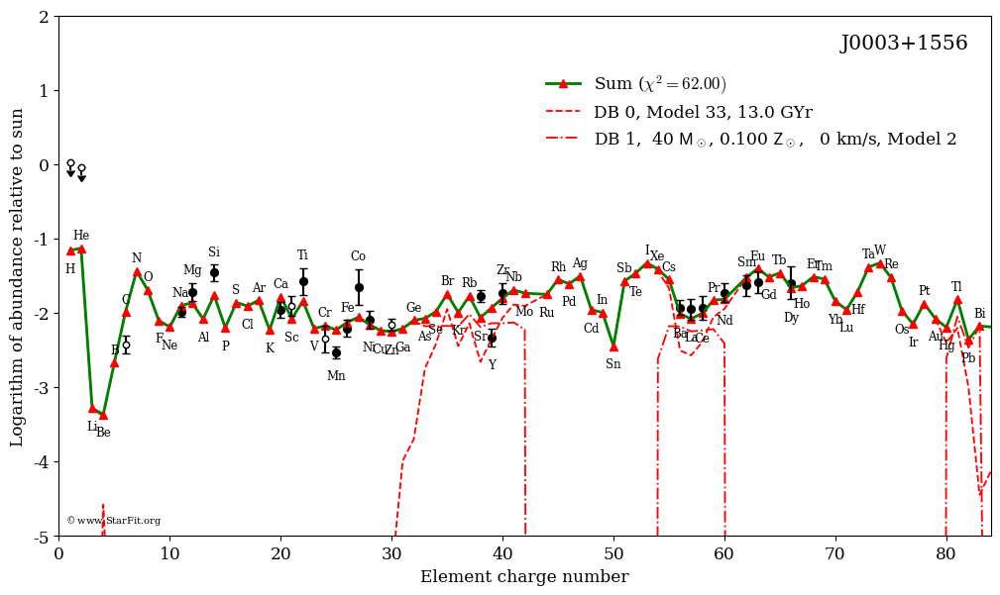

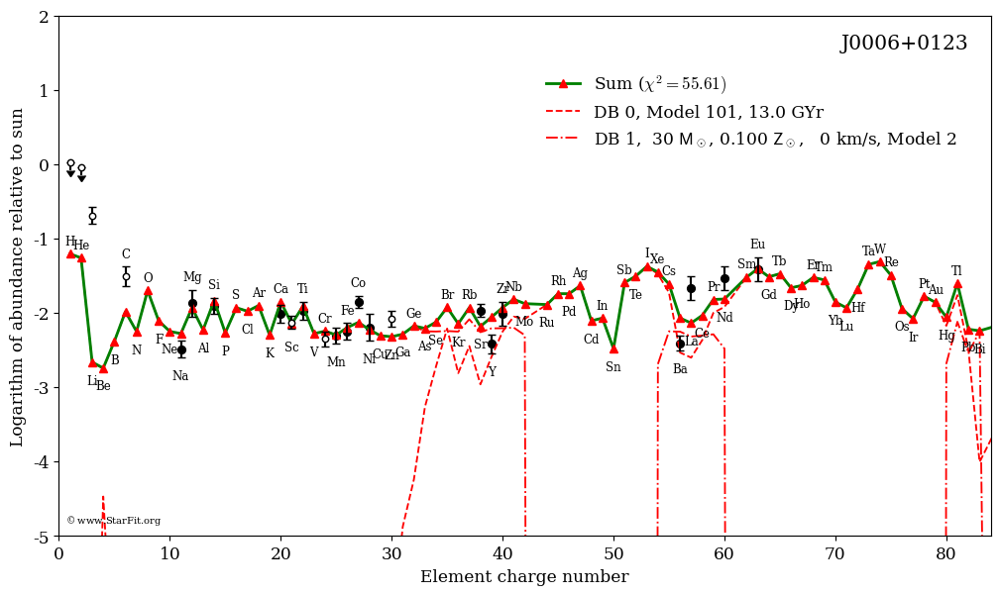

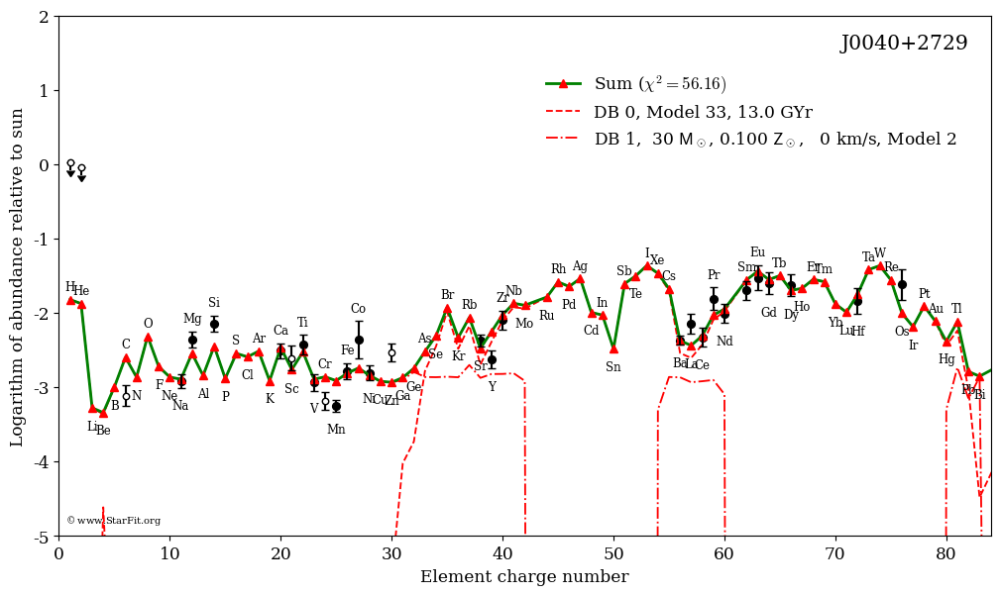

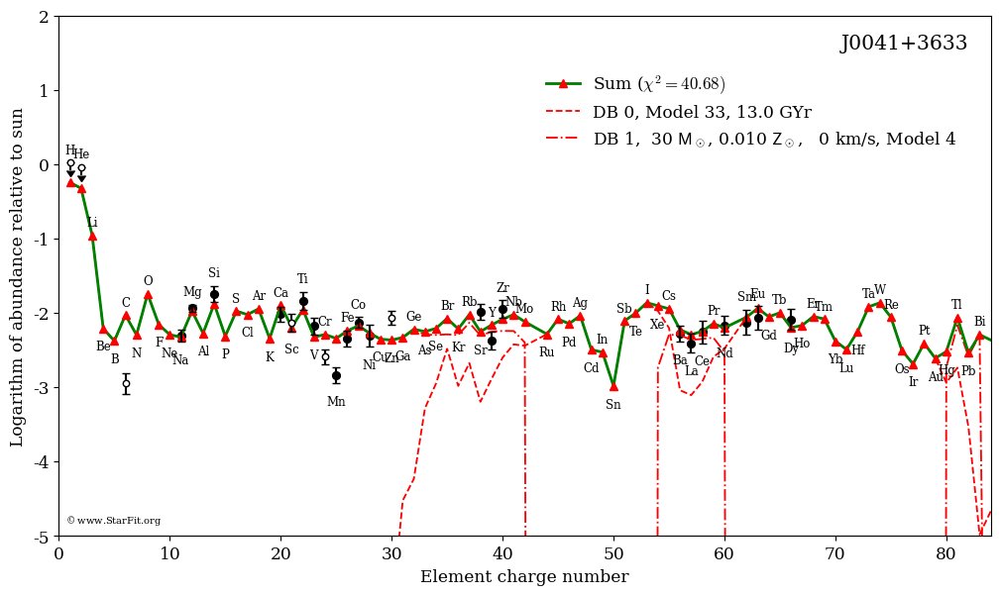

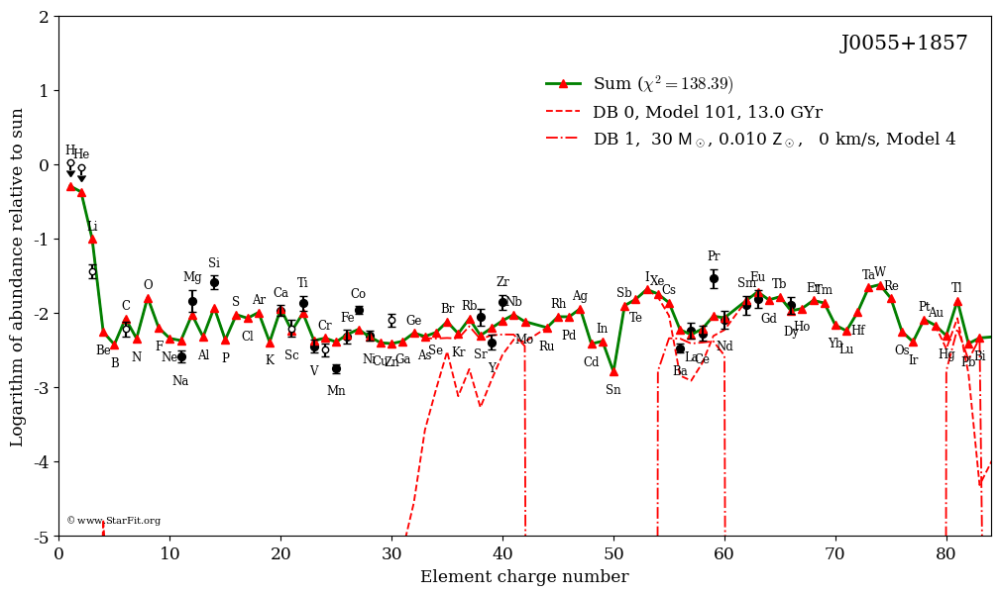

...

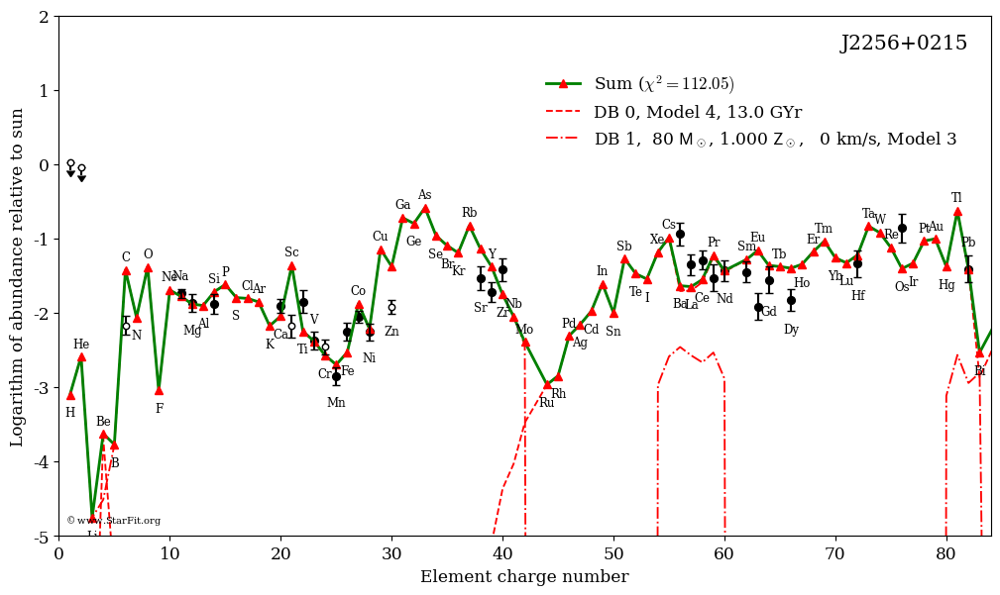

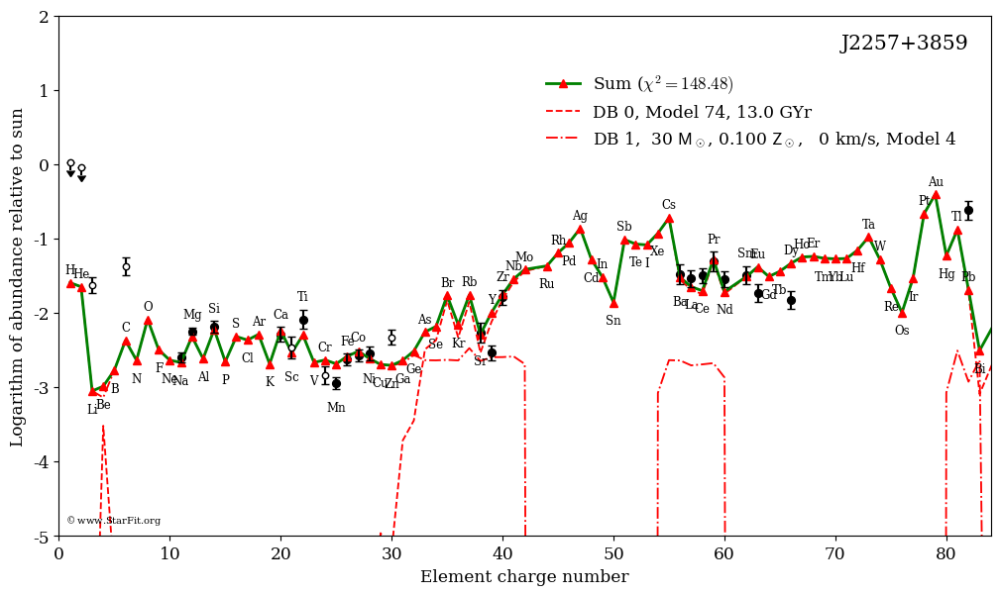

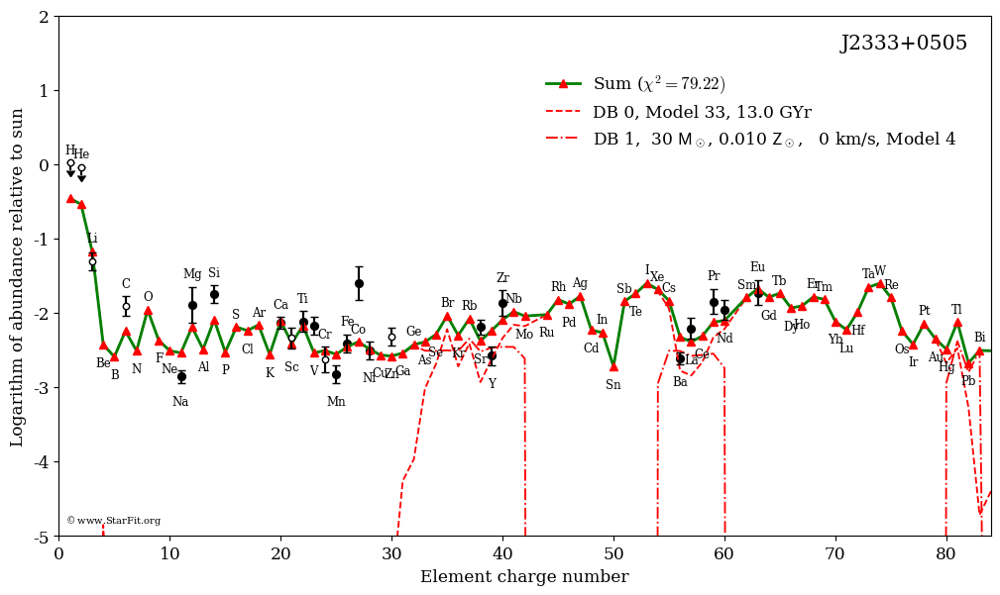

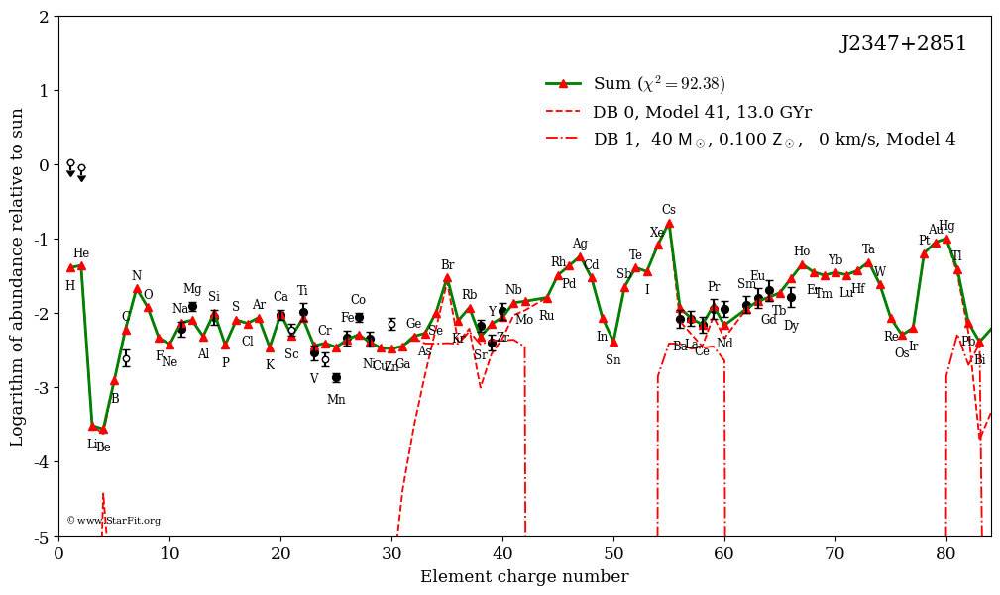

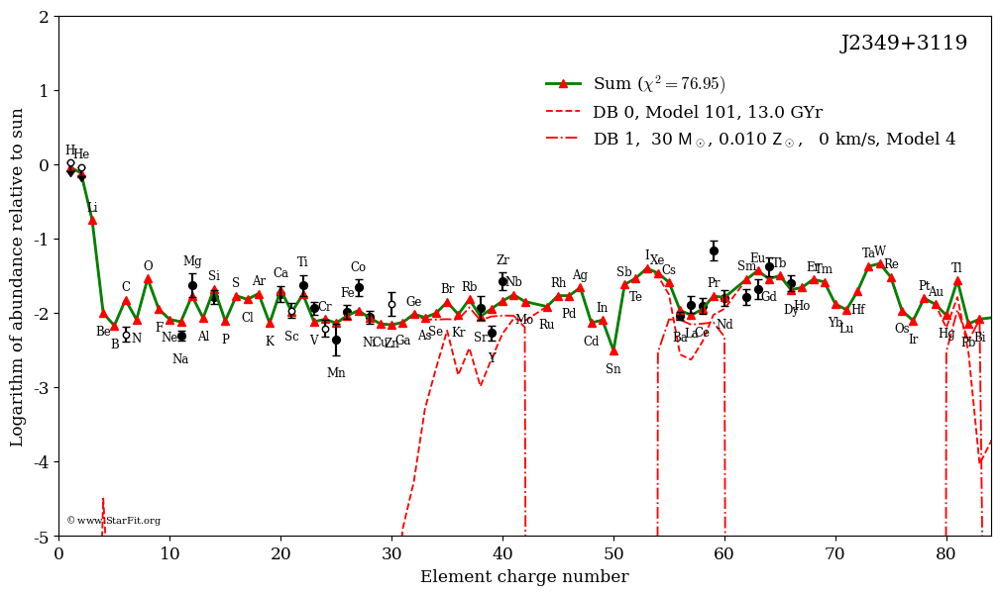

In [10]:
columns = []
properties = ['name', 'FeH', 'N', 'fitness']
freeparams_num = 0
columns.extend([('property', prop) for prop in properties])
dbnames = ['rproc.wu.star.el.y.stardb.xz', 'nuc.lc18.star.el.y.stardb.xz']
for _didx, _dname in enumerate(dbnames):
    dbpath = find_data('db', _dname)
    _db = StarDB(dbpath, silent=True)
    freeparams_num += np.sum(1-_db.fieldflags)
    fieldnames = _db.fieldnames
    columns.extend([('%d'%_didx, _) for _ in np.append(fieldnames, 'offset')])
    df_result = pd.DataFrame(columns=columns)
    df_result.columns = pd.MultiIndex.from_tuples(df_result.columns, names=['db_index','fieldname'])

for objname in df.loc[:, ('property', 'name')].values:
    starname = objname
    flag = df.loc[:, ('property', 'name')].values == starname
    starFeH = df.loc[flag, ('property', 'FeH')].values[0]
    starpath = stardir/('%s.dat'%(objname))
    comb = Multi(
        starpath, db=dbnames, 
        z_min=1, z_max=100, z_exclude=[1, 2, 3, 6, 19, 21, 24, 30], 
        silent=True, sol_size=2, group=[1, 1], 
        constraints='1:rotation<100')
    comb.plot(xlim=(0, 84), ylim=(-5, 2))
    break
    starN = comb.star.element_abundances[~comb.exclude_index].shape[0]
    dof = starN - freeparams_num - 2

    starfitn = comb.sorted_fitness[0] / dof
    starindices = comb.sorted_stars[0]['index']
    staroffsets = comb.sorted_stars[0]['offset']
    db_idx = comb.db_idx[starindices]
    db_off = comb.db_off
    starindices -= db_off
    starprop = [starname, starFeH, starN, starfitn]
    columndata = starprop
    for _db_idx, _staridx, _staroffset in zip(db_idx, starindices, staroffsets):
        starfield = list(comb.db[_db_idx].fielddata[_staridx])
        stardata = starfield + [_staroffset]
        columndata += stardata
    df_result.loc[len(df_result)] = columndata
# df_result.to_csv('goodfit_result_lc18nonrot.csv', index=False)   

In [2]:
objname = 'J0041+3633'
starname = objname
flag = df.loc[:, ('property', 'name')].values == starname
starFeH = df.loc[flag, ('property', 'FeH')].values[0]
starpath = stardir/('%s.dat'%(objname))
comb = Multi(
    starpath, db=[
        # 'rproc.wu.star.el.y.stardb.xz', 
        # 'rproc.just15.star.el.y.stardb.xz', 
        'nuc.lc18.star.el.y.stardb.xz', 
        # 'znuc2012.S4.star.el.y.stardb.gz', 
    ], 
    z_min=35, z_max=60, z_exclude=[1, 2, 3, 6], 
    silent=True, sol_size=1, 
    constraints='0:metallicity<0.1,rotation>1'
)
comb.plot(xlim=(0, 84), ylim=(-5, 2))

In [3]:
objname = 'J0041+3633'
starname = objname
flag = df.loc[:, ('property', 'name')].values == starname
starFeH = df.loc[flag, ('property', 'FeH')].values[0]
starpath = stardir/('%s.dat'%(objname))
comb = Multi(
    starpath, db=[
        # 'rproc.wu.star.el.y.stardb.xz', 
        # 'rproc.just15.star.el.y.stardb.xz', 
        # 'nuc.lc18.star.el.y.stardb.xz', 
        'znuc2012.S4.star.el.y.stardb.gz', 
    ], 
    z_min=1, z_max=30, z_exclude=[1, 2, 3, 6], 
    silent=True, sol_size=1, 
    constraints='1:metallicity<0.1,rotation>0'
)
comb.plot(xlim=(0, 84), ylim=(-5, 2))

In [4]:
objname = 'J0041+3633'
starname = objname
flag = df.loc[:, ('property', 'name')].values == starname
starFeH = df.loc[flag, ('property', 'FeH')].values[0]
starpath = stardir/('%s.dat'%(objname))
comb = Multi(
    starpath, db=[
        'rproc.wu.star.el.y.stardb.xz', 
        # 'rproc.just15.star.el.y.stardb.xz', 
        # 'nuc.lc18.star.el.y.stardb.xz', 
        # 'znuc2012.S4.star.el.y.stardb.gz', 
    ], 
    z_min=35, z_max=85, z_exclude=[1, 2, 3, 6], 
    silent=True, sol_size=1, 
    # constraints='1:metallicity<0.1,rotation>0'
)
comb.plot(xlim=(0, 84), ylim=(-5, 2))

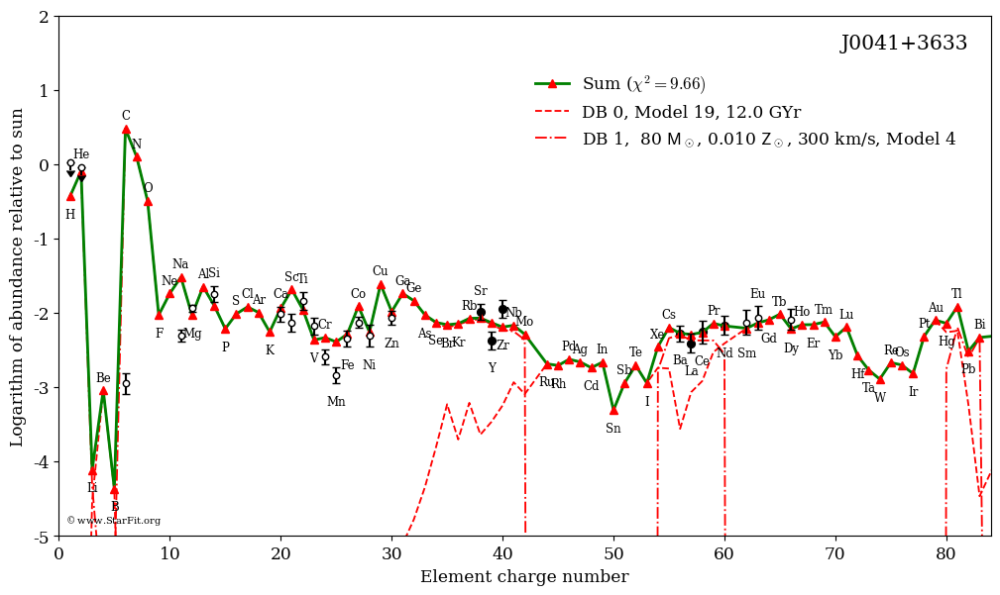

In [40]:
objname = 'J0041+3633'
starname = objname
flag = df.loc[:, ('property', 'name')].values == starname
starFeH = df.loc[flag, ('property', 'FeH')].values[0]
starpath = stardir/('%s.dat'%(objname))
comb = Multi(
    starpath, db=[
        # 'rproc.wu.star.el.y.stardb.xz', 
        'rproc.just15.star.el.y.stardb.xz', 
        'nuc.lc18.star.el.y.stardb.xz', 
        # 'znuc2012.S4.star.el.y.stardb.gz', 
    ], 
    z_min=35, z_max=60, z_exclude=[1, 2, 3, 6], 
    silent=True, sol_size=2, group=[1, 1],  
    constraints='1:metallicity<0.1,rotation>0'
)
comb.plot(xlim=(0, 84), ylim=(-5, 2))